In [1]:
# standar libraries
import os 
import sys

# third-party libraries
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import random
import pandas as pd
import torch
import shap
from transformers import (
    pipeline, 
    PreTrainedTokenizer, 
    AutoTokenizer, 
    AutoModelForSequenceClassification
)
from typing import List, Dict, Any
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from bertviz import head_view
from sklearn.metrics import(
    accuracy_score,
    classification_report, 
    roc_auc_score, 
    roc_curve, 
    confusion_matrix,
    ConfusionMatrixDisplay
)
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import ClassificationMetric
from aif360.algorithms.postprocessing import RejectOptionClassification

# local module
sys.path.append(os.path.abspath(".."))
from project_config import from_root

pip install 'aif360[AdversarialDebiasing]'
pip install 'aif360[AdversarialDebiasing]'
pip install 'aif360[Reductions]'
pip install 'aif360[Reductions]'
pip install 'aif360[inFairness]'
pip install 'aif360[Reductions]'


In [2]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [3]:
train_df = pd.read_csv(from_root("data", "adress_train.tsv"), sep="\t")
test_df = pd.read_csv(from_root("data", "adress_test.tsv"), sep="\t")
labels_df = pd.read_csv(from_root("data", "raw", "labels.tsv"), sep="\t")
# remove the whitespace
labels_df["ID"] = labels_df["ID"].str.strip()
test_df["ID"] = test_df["ID"].str.strip()

# merge test with true labels file
test_df = test_df.merge(labels_df, on="ID", how="inner")

train_texts = train_df["transcription"].tolist()
train_labels = train_df["label"].tolist()
test_texts = test_df["transcription"].tolist()
test_labels = test_df["Label"].astype(int).tolist()

In [4]:
tokenizer =  AutoTokenizer.from_pretrained("roberta-base")
all_texts = train_texts + test_texts
token_length = [len(tokenizer.encode(text, add_special_tokens=True)) for text in all_texts] 

print(f"Total samples: {len(all_texts)}")
print(f"Min: {np.min(token_length)}")
print(f"Max: {np.max(token_length)}")
print(f"Mean: {np.mean(token_length):.2f}")
print(f"Median: {np.median(token_length)}")
print(f"90th percentile: {np.percentile(token_length, 90)}")
print(f"95th percentile: {np.percentile(token_length, 95)}")

Total samples: 156
Min: 30
Max: 366
Mean: 102.81
Median: 93.0
90th percentile: 168.0
95th percentile: 191.75


In [5]:
# model_name = "roberta-large"
model_name = "roberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
model.to(device)

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Using device: cuda


RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
         

In [6]:
# =============================================================================
# Title: Fine-tuning with custom datasets
# Author: Hugging Face
# Date: 2020
# Code version: version 2.0
# Type: Documentation / Source code example
# Availability: https://huggingface.co/transformers/v4.7.0/custom_datasets.html
# Note: The following code was adapted from the above source.
# =============================================================================
class AdressDataset(Dataset):
    def __init__(
        self,
        texts : List[str], 
        labels : List[int], 
        tokenizer : PreTrainedTokenizer,
        max_len : int
    ):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self) -> int:
        return len(self.texts)

    def __getitem__(self, idx: int) -> Dict[str, torch.Tensor]:
        # get text and label for given index
        text = str(self.texts[idx])
        label = self.labels[idx]
        # encode text using huggingface tokenizer
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            truncation=True,
            padding="max_length",
            return_attention_mask=True,
            return_tensors="pt"
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            # label need to be tensor for cross entropy loss
            "labels": torch.tensor(label, dtype=torch.long)
        }

MAX_LEN = 256
# BATCH_SIZE = 8 # for roberta-large
BATCH_SIZE = 16 
EPOCHS = 5

def seed_worker(worker_id : int) -> None:
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g = torch.Generator()
g.manual_seed(SEED)

train_dataset = AdressDataset(train_texts, train_labels, tokenizer, MAX_LEN)
test_dataset = AdressDataset(test_texts, test_labels, tokenizer, MAX_LEN)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, worker_init_fn=seed_worker, generator=g)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, worker_init_fn=seed_worker, generator=g)

In [7]:
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5)
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5)

criterion = torch.nn.CrossEntropyLoss()

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0
    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["labels"].to(device)

        optimizer.zero_grad()
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        total_loss += loss.item()
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1} Training Loss: {total_loss / len(train_loader):.4f}")

Epoch 1:   0%|          | 0/7 [00:00<?, ?it/s]c:\Users\Omen\anaconda3\envs\roberta\lib\site-packages\transformers\models\roberta\modeling_roberta.py:370: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(
Epoch 1: 100%|██████████| 7/7 [00:04<00:00,  1.68it/s]


Epoch 1 Training Loss: 0.7084


Epoch 2: 100%|██████████| 7/7 [00:03<00:00,  1.85it/s]


Epoch 2 Training Loss: 0.6686


Epoch 3: 100%|██████████| 7/7 [00:03<00:00,  1.87it/s]


Epoch 3 Training Loss: 0.5979


Epoch 4: 100%|██████████| 7/7 [00:03<00:00,  1.90it/s]


Epoch 4 Training Loss: 0.3390


Epoch 5: 100%|██████████| 7/7 [00:03<00:00,  1.89it/s]

Epoch 5 Training Loss: 0.2677


Testing: 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]



Test Accuracy: 0.8542
Classification Report:
               precision    recall  f1-score   support

           0      0.840     0.875     0.857        24
           1      0.870     0.833     0.851        24

    accuracy                          0.854        48
   macro avg      0.855     0.854     0.854        48
weighted avg      0.855     0.854     0.854        48

ROC-AUC:  0.8802083333333334


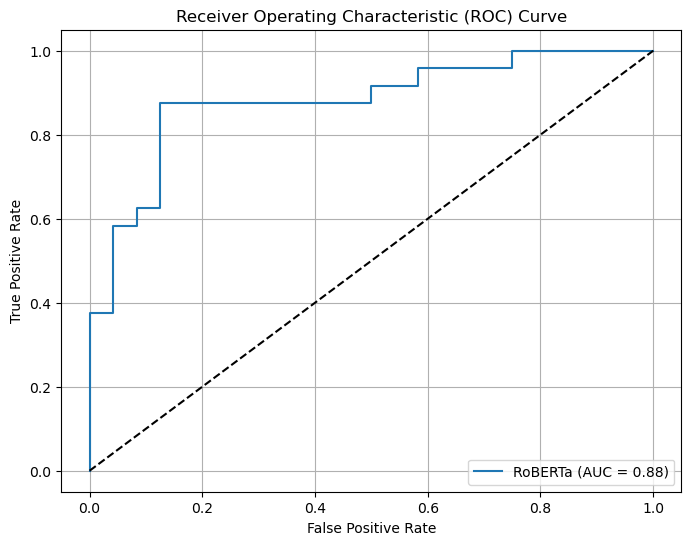

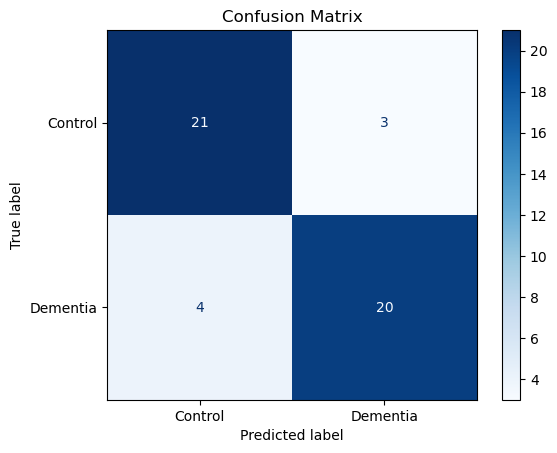

In [8]:
model.eval()
all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for batch in tqdm(test_loader, desc="Testing"):
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["labels"].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        probs = F.softmax(outputs.logits, dim=1)
        preds = torch.argmax(probs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs[:, 1].cpu().numpy())  # probability of class 1 (AD)

# metrics
accuracy = accuracy_score(all_labels, all_preds)
print(f"\nTest Accuracy: {accuracy:.4f}")
print("Classification Report:\n", classification_report(all_labels, all_preds, digits=3))

# ROC Curve
fpr, tpr, thresholds = roc_curve(all_labels, all_probs)
roc_auc = roc_auc_score(all_labels, all_probs)

print(f"ROC-AUC: ", roc_auc)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label=f'RoBERTa (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # random guess
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Control", "Dementia"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

In [9]:
test_df["predicted_label"] = all_preds
test_df["predicted_proba"] = all_probs
test_df["Label"] = test_df["Label"].astype(int)

# encode sensitive attributes
test_df["gender_bin"] = test_df["gender"].map({"m": 1, "f": 0})
test_df["age_group_65"] = (test_df["age"] >= 65).astype(int)

# OUTPUT_PATH = from_root("output", "roberta","adress", "roberta_adress_test_predictions.tsv")
OUTPUT_PATH = from_root("output", "roberta","adress", "roberta_base_adress_test_predictions.tsv")
os.makedirs(os.path.dirname(OUTPUT_PATH), exist_ok=True)

test_df[["ID", "Label", "predicted_label", "predicted_proba", "gender_bin", "age_group_65"]].to_csv(OUTPUT_PATH, sep="\t", index=False)

In [10]:
# MODEL_PATH = from_root("output", "models", "roberta_adress_model.pt")
MODEL_PATH = from_root("output", "models", "roberta_base_adress_model.pt")
os.makedirs(os.path.dirname(MODEL_PATH), exist_ok=True)
torch.save(model.state_dict(), MODEL_PATH)

# TOK_PATH = from_root("output", "models", "roberta_adress_tokenizer")
TOK_PATH = from_root("output", "models", "roberta_base_adress_tokenizer")
os.makedirs(os.path.dirname(TOK_PATH), exist_ok=True)
_ = tokenizer.save_pretrained(TOK_PATH)

**Fairness Metrics** - before mitigation

In [11]:
FILE_PATH = from_root("output", "roberta", "adress", "roberta_base_adress_test_predictions.tsv")
df = pd.read_csv(FILE_PATH, sep="\t")
# print(df)

In [12]:
# privileged -> female (0) and age >= 65 (1)
# unprivileged -> male (1) and age < 65 (0)
PROTECTED_GROUPS = {
    "gender_bin": {"privileged": 0, "unprivileged": 1},
    "age_group_65": {"privileged": 1, "unprivileged": 0},
} 
def load_and_prepare_fairness_data_roberta() -> pd.DataFrame:
    df = pd.read_csv(FILE_PATH, sep="\t")
    df["ID"] = df["ID"].astype(str)
    df["Label"] = df["Label"].astype(int)
    df["predicted_label"] = df["predicted_label"].astype(int)

    return df


def safe_metric(name: str, func) -> str:
    try:
        value = func()
        if not np.isnan(value):
            return f"{value:.3f}"
        else:
            return "N/A"
    except Exception:
        return "N/A"
    
    
def compute_fairness_metrics(df, protected_attr, priv_val, unpriv_val, label_col="Label"):
    dataset_true = BinaryLabelDataset(
        df=df[[label_col, protected_attr]].copy(),
        label_names=[label_col],
        protected_attribute_names=[protected_attr]
    )

    dataset_pred = dataset_true.copy()
    dataset_pred.labels = df["predicted_label"].values.reshape(-1, 1)

    metric = ClassificationMetric(
        dataset_true, dataset_pred,
        privileged_groups=[{protected_attr: priv_val}],
        unprivileged_groups=[{protected_attr: unpriv_val}]
    )

    print(f"\nFairness Metrics for {protected_attr.upper()}:")
    print(f"  Accuracy:                    {accuracy_score(df[label_col], df['predicted_label']):.3f}")
    print(f"  Statistical Parity Diff:     {safe_metric('SPD', metric.statistical_parity_difference)}")
    print(f"  Equal Opportunity Diff:      {safe_metric('EOD', metric.equal_opportunity_difference)}")
    print(f"  Average Odds Diff:           {safe_metric('AOD', metric.average_odds_difference)}")
    print(f"  Disparate Impact:            {safe_metric('DI', metric.disparate_impact)}")


def evaluate_all_fairness_metrics_roberta() -> None:
    df = load_and_prepare_fairness_data_roberta()

    for attr, values in PROTECTED_GROUPS.items():
        print(f"\nEvaluating fairness metrics for {attr} (privileged: {values['privileged']}, unprivileged: {values['unprivileged']})")
        compute_fairness_metrics(df, attr, values["privileged"], values["unprivileged"])


evaluate_all_fairness_metrics_roberta()


Evaluating fairness metrics for gender_bin (privileged: 0, unprivileged: 1)

Fairness Metrics for GENDER_BIN:
  Accuracy:                    0.854
  Statistical Parity Diff:     -0.045
  Equal Opportunity Diff:      -0.028
  Average Odds Diff:           -0.045
  Disparate Impact:            0.909

Evaluating fairness metrics for age_group_65 (privileged: 1, unprivileged: 0)

Fairness Metrics for AGE_GROUP_65:
  Accuracy:                    0.854
  Statistical Parity Diff:     0.033
  Equal Opportunity Diff:      -0.089
  Average Odds Diff:           0.033
  Disparate Impact:            1.071


Apply mitigation - ROC


Fairness Metrics for GENDER:
    Accuracy before ROC:           0.854
    Accuracy after ROC:            0.833
    Statistical Parity Difference: 0.000
    Equal Opportunity Difference:  -0.028
    Average Odds Difference:       0.000
    Disparate Impact:              1.000


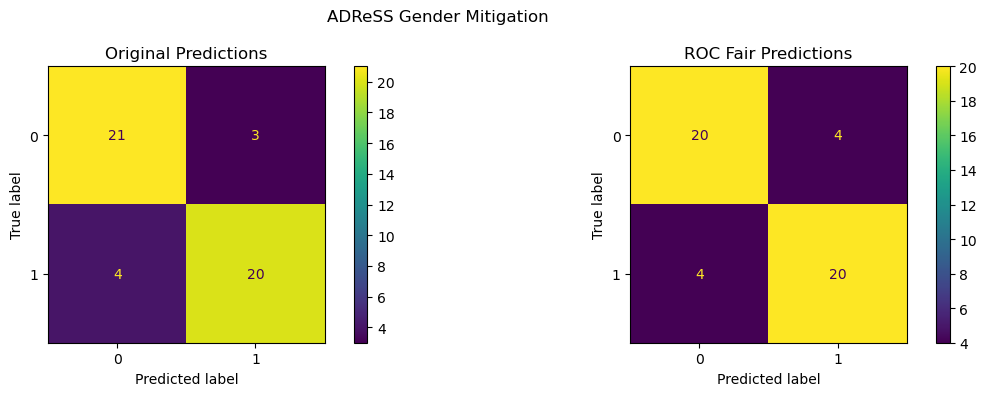

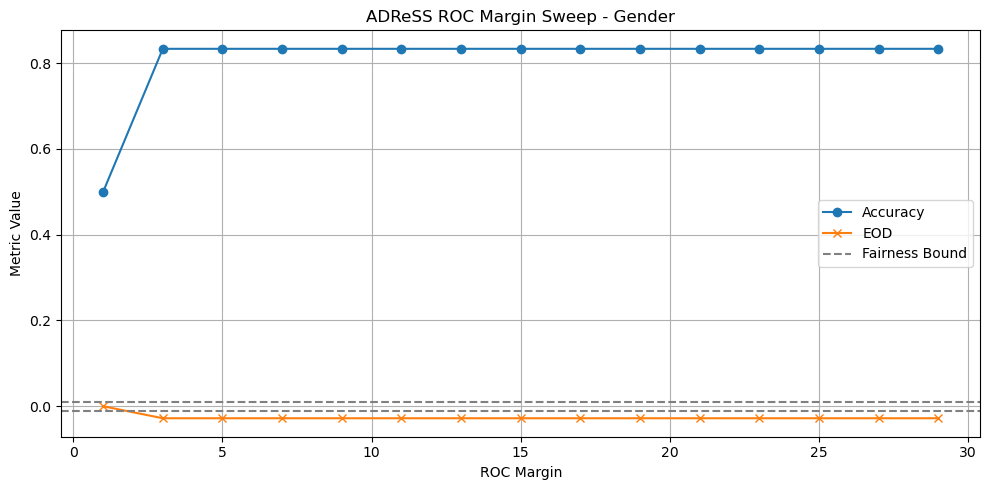


Fairness Metrics for AGE 65+:
    Accuracy before ROC:           0.854
    Accuracy after ROC:            0.750
    Statistical Parity Difference: 0.000
    Equal Opportunity Difference:  -0.044
    Average Odds Difference:       0.000
    Disparate Impact:              1.000


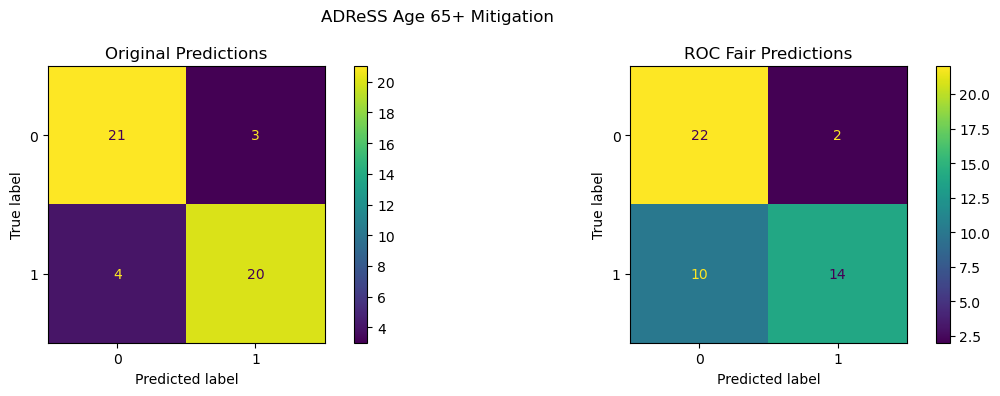

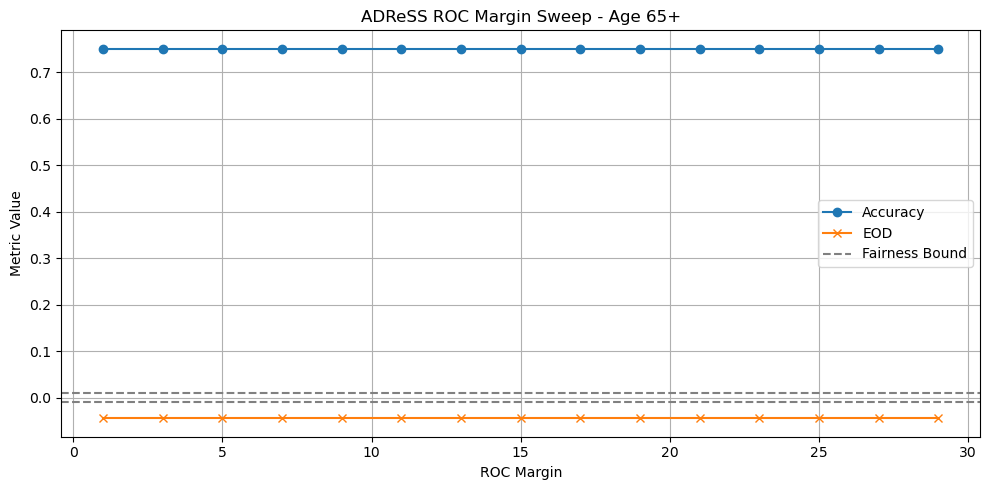

In [13]:
def apply_roc_and_plot(
    df: pd.DataFrame,
    group_col: str,
    group_name: str,
    privileged_val: int,
    unprivileged_val: int,
    save_prefix: str
) -> np.ndarray:
    aif_data = BinaryLabelDataset(
        df=df[["Label", group_col]].copy(),
        label_names=["Label"],
        protected_attribute_names=[group_col],
        favorable_label=1,
        unfavorable_label=0
    )

    aif_pred = aif_data.copy()
    aif_pred.scores = df["predicted_proba"].values.reshape(-1, 1)
    aif_pred.labels = df["predicted_label"].values.reshape(-1, 1)

    roc = RejectOptionClassification(
        unprivileged_groups=[{group_col: unprivileged_val}],
        privileged_groups=[{group_col: privileged_val}],
        metric_name="Statistical parity difference",
        metric_ub=0.01,
        metric_lb=-0.01
    ).fit(aif_data, aif_pred)

    fair_pred = roc.predict(aif_pred)

    metric = ClassificationMetric(
        aif_data, fair_pred,
        privileged_groups=[{group_col: privileged_val}],
        unprivileged_groups=[{group_col: unprivileged_val}]
    )

    print(f"\nFairness Metrics for {group_name.upper()}:")
    print(f"    Accuracy before ROC:           {accuracy_score(df['Label'], df['predicted_label']):.3f}")
    print(f"    Accuracy after ROC:            {accuracy_score(df['Label'], fair_pred.labels.ravel()):.3f}")
    print(f"    Statistical Parity Difference: {metric.statistical_parity_difference():.3f}")
    print(f"    Equal Opportunity Difference:  {metric.equal_opportunity_difference():.3f}")
    print(f"    Average Odds Difference:       {metric.average_odds_difference():.3f}")
    print(f"    Disparate Impact:              {metric.disparate_impact():.3f}")

    # confusion matrices
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    ConfusionMatrixDisplay(confusion_matrix(df["Label"], df["predicted_label"]),
                           display_labels=[0, 1]).plot(ax=axs[0])
    axs[0].set_title("Original Predictions")
    ConfusionMatrixDisplay(confusion_matrix(df["Label"], fair_pred.labels.ravel()),
                           display_labels=[0, 1]).plot(ax=axs[1])
    axs[1].set_title("ROC Fair Predictions")
    plt.suptitle(f"ADReSS {group_name} Mitigation")
    plt.tight_layout()
    plot_path = from_root("output", "fairness")
    plt.savefig(os.path.join(plot_path, f"roc_cm_{save_prefix}_adress_roberta.png"))
    plt.show()

    # ROC margin sweep plot
    margins = range(1, 30, 2)
    spds, accs = [], []

    for m in margins:
        sweep = RejectOptionClassification(
            unprivileged_groups=[{group_col: unprivileged_val}],
            privileged_groups=[{group_col: privileged_val}],
            metric_name="Statistical parity difference",
            metric_ub=0.01,
            metric_lb=-0.01,
            num_ROC_margin=m
        ).fit(aif_data, aif_pred)

        pred = sweep.predict(aif_pred)
        mtr = ClassificationMetric(
            aif_data, pred,
            privileged_groups=[{group_col: privileged_val}],
            unprivileged_groups=[{group_col: unprivileged_val}]
        )

        spds.append(mtr.equal_opportunity_difference())
        accs.append(accuracy_score(df["Label"], pred.labels.ravel()))

    plt.figure(figsize=(10, 5))
    plt.plot(margins, accs, label="Accuracy", marker="o")
    plt.plot(margins, spds, label="EOD", marker="x")
    plt.axhline(0.01, color="gray", linestyle="--", label="Fairness Bound")
    plt.axhline(-0.01, color="gray", linestyle="--")
    plt.xlabel("ROC Margin")
    plt.ylabel("Metric Value")
    plt.title(f"ADReSS ROC Margin Sweep - {group_name}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plot_path = from_root("output", "fairness")
    plt.savefig(os.path.join(plot_path, f"roc_margin_sweep_{save_prefix}_adress_roberta.png"))
    plt.show()

    return fair_pred.labels.ravel()

def run_roc_fairness_roberta() -> pd.DataFrame:
    # FILE_PATH = from_root("output", "roberta", "adress", "roberta_adress_test_predictions.tsv")
    FILE_PATH = from_root("output", "roberta", "adress", "roberta_base_adress_test_predictions.tsv")
    df = pd.read_csv(FILE_PATH, sep="\t")

    # apply ROC w/ plot for gender
    df["gender_bin_ROC_label"] = apply_roc_and_plot(
        df,
        group_col="gender_bin",
        group_name="Gender",
        privileged_val=0,
        unprivileged_val=1,
        save_prefix="gender"
    )
    # apply ROC w/ plot for age
    df["age_group_65_ROC_label"] = apply_roc_and_plot(
        df,
        group_col="age_group_65",
        group_name="Age 65+",
        privileged_val=1,
        unprivileged_val=0,
        save_prefix="age"
    )

    return df

df_roc = run_roc_fairness_roberta()

**SHAP** - Explainability 

In [14]:
test_texts_subset = test_df["transcription"].sample(n=min(20, len(test_df)), random_state=1).tolist()
i = 0 # can changhe the index to see other examples

sample_text = test_texts_subset[i]
print(f"Sample text: {sample_text}")
labels = test_df["Label"].tolist()
print(f"True label: {labels[i]}")
predicted_label = df_roc["predicted_label"].tolist()
print(f"Predicted label: {predicted_label[i]}")

Sample text: okay the kid on the bench whos got his hand in the cookie jar and uh his mother is standing in a puddle of water because she didnt she oughta dry her feet instead uh the window is open um uh well the sink is overflowing uh its obviously summer because the window as I said was open theres uh supposedly leaves on the trees uh anything else that Im sposta pick up well the kids gonna fall off and it xxx the lid is off the cookie jar and hes got one in his hand and handing it to his sister and one and hes sneaking another one not sneaking uh the water is still running in the sink and splashing on the floor
True label: 0
Predicted label: 0


In [15]:
# create classification pipeline 
roberta_pipeline = pipeline(
    "text-classification", 
    model=model, 
    tokenizer=tokenizer,
      device=0 if torch.cuda.is_available() else -1, 
      return_all_scores=True
)

# get sample texts 
background_texts = test_df["transcription"].sample(n=min(100, len(test_df)), random_state=42).tolist()
test_texts_subset = test_df["transcription"].sample(n=min(20, len(test_df)), random_state=1).tolist()

# SHAP explainer from pipline
explainer = shap.Explainer(roberta_pipeline)
shap_values = explainer(test_texts_subset)

shap.plots.text(shap_values[0]) # plot for the first sample 

Device set to use cuda:0
c:\Users\Omen\anaconda3\envs\roberta\lib\site-packages\transformers\pipelines\text_classification.py:106: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|▌         | 1/20 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█▌        | 3/20 [00:20<01:07,  3.94s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 4/20 [00:27<01:24,  5.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  25%|██▌       | 5/20 [00:35<01:32,  6.15s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  30%|███       | 6/20 [00:43<01:34,  6.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  35%|███▌      | 7/20 [00:50<01:31,  7.00s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  40%|████      | 8/20 [00:58<01:25,  7.09s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  45%|████▌     | 9/20 [01:05<01:19,  7.19s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 10/20 [01:12<01:12,  7.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▌    | 11/20 [01:20<01:05,  7.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 12/20 [01:27<00:58,  7.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  65%|██████▌   | 13/20 [01:35<00:51,  7.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  70%|███████   | 14/20 [01:42<00:43,  7.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|███████▌  | 15/20 [01:49<00:36,  7.24s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 16/20 [01:56<00:28,  7.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  85%|████████▌ | 17/20 [02:03<00:21,  7.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|█████████ | 18/20 [02:10<00:14,  7.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  95%|█████████▌| 19/20 [02:19<00:07,  7.52s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 20/20 [02:26<00:00,  7.48s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 21it [02:34,  7.70s/it]                        


In [16]:
model_name = "roberta-base"  
# model_name = "roberta-large"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2, output_attentions=True)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device)
model.eval()

sample_text = test_df["transcription"].iloc[0] # can change to another one 

inputs = tokenizer(
    sample_text,
    return_tensors="pt",
    truncation=True,
    padding=True,
    max_length=256,
    add_special_tokens=True
)

input_ids = inputs["input_ids"].to(device)
attention_mask = inputs["attention_mask"].to(device)

# get the outputs with attention
with torch.no_grad():
    outputs = model(input_ids=input_ids, attention_mask=attention_mask)
    attentions = outputs.attentions  

# visualize attention using bertviz
tokens = tokenizer.convert_ids_to_tokens(input_ids[0])
head_view(attentions, tokens)

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
RobertaSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


<IPython.core.display.Javascript object>